Based on the 'activation maximization' technique suggested in [this](https://pdfs.semanticscholar.org/65d9/94fb778a8d9e0f632659fb33a082949a50d3.pdf) paper. 

We will view the layers of the (pretrained) GoogLeNet just like in [this](https://distill.pub/2017/feature-visualization/) post.

## Import useful libraries 

In [1]:
import torch

In [2]:
torch.cuda.is_available()

True

In [3]:
import numpy as np
import matplotlib.pyplot as plt

from torchvision import models

## Import a pretrained GoogLeNet

In [4]:
model = models.googlenet(pretrained = True)

model

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [5]:
# We now freeze the parameters of our pretrained model
for param in model.parameters():
    param.requires_grad_(False)

In [6]:
# layer: inception4a
model.inception4a

Inception(
  (branch1): BasicConv2d(
    (conv): Conv2d(480, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (branch2): Sequential(
    (0): BasicConv2d(
      (conv): Conv2d(480, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(96, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicConv2d(
      (conv): Conv2d(96, 208, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(208, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (branch3): Sequential(
    (0): BasicConv2d(
      (conv): Conv2d(480, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicConv2d(
      (conv): Conv2d(16, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): Batc

In [7]:
# We will register a forward hook to get the output of the layers

activation = {} # to store the activation  of a layer
def create_hook(name):
    def hook(m, i, o):
        # copy the output of the given layer
        activation[name] = o
       
    return hook


# register a forward hook for layer inception4a i.e. the first inception layer
model.inception4a.register_forward_hook(create_hook('4a'))

In [8]:
# normalize the input image to have appropriate mean and standard deviation as specified by pytorch
from torchvision import transforms



normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])


# undo the above normalization if and when the need arises 
denormalize = transforms.Normalize(mean = [-0.485/0.229, -0.456/0.224, -0.406/0.225],
                                   std = [1/0.229, 1/0.224, 1/0.225] )

In [9]:
from torch import optim

In [10]:
# function to massage img_tensor for using as input to plt.imshow()
def image_converter(im):
    
    # move the image to cpu
    im_copy = im.cpu()
    
    # for plt.imshow() the channel-dimension is the last
    # therefore use transpose to permute 
    im_copy = denormalize(im_copy.clone().detach()).numpy().transpose(1,2,0)
    # clip negative values as plt.imshow() only accepts 
    # floating values in range [0,1] and integers in range [0,255]
    im_copy = im_copy.clip(0, 1) 
    
    return im_copy


## Trial 1: Naive Activation maximization

In this section we define the activation of a unit to be the mean of the elements in the output tensor produced by it.

### Create an input image 

The starting image will consist of random values for the pixels

In [11]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))

img_shape:(3, 224, 224), img_dtype: float32


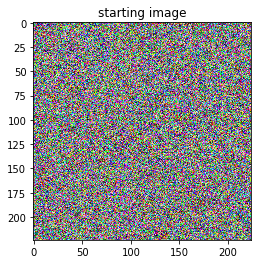

In [12]:
# Starting Image
plt.imshow(image_converter(img_tensor))                                                               
plt.title('starting image')
plt.show()

In [13]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)
img_tensor = img_tensor.to(device).requires_grad_(True) # move the image tensor to cuda 
                                                        # set its requires_grad_ flag to be true

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.01)

Calculations being executed on cuda
googlenet is on cuda: True
img_tensor is on cuda: True


In [14]:
# understanding the shape of the output produced by a given layer
image = img_tensor.clone().detach().to(device).requires_grad_(True)
model(image.unsqueeze(0))
activation['4a'].shape

torch.Size([1, 512, 14, 14])

From above we see that the 'inception4a' layer of googlenet produces an output tensor having 512 channels with Height = Width = 14.

The 512 channels produced above can be understood as follows:

The inception4a layer consists of 4 independent branches whose output is collated along the batch dimension. 

 - 1) branch 1: This is basic 2d conv. layer consisting of 192 units. Thus it contributes 192 to the  number of channels in the final output
 
 
 - 2) branch 2: This is has two conv. layers applied sequentially. The second conv. layer contains 208 units. This branch therefore contributes 208 to the number of channels in the final output
 
 
 
 - 3) branch 3: This also has two conv. layers applied sequentially and contributes 48 to the number of channels in the final output
 
 
 
 - 4) branch 4: This has a maxpool layer followed by a 2d conv. layer. This branch contributes 64 to the final number of channels. 
 
We thus see that the total number of channels in the final output of 'inception4a' should be 192 + 208 + 48 + 64 = 512 which matches with the output of the previous cell.  

### Generating the final image maximizing a unit's output

epoch: 0/10000, activation: 0.024361494928598404


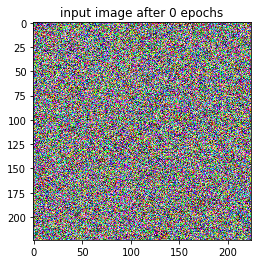

epoch: 1000/10000, activation: 29.481779098510742


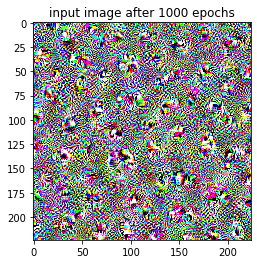

epoch: 2000/10000, activation: 50.73944091796875


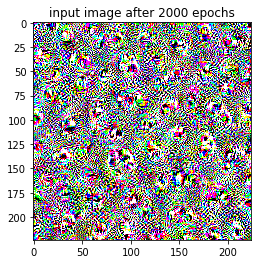

epoch: 3000/10000, activation: 72.64332580566406


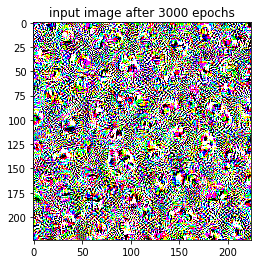

epoch: 4000/10000, activation: 95.24925994873047


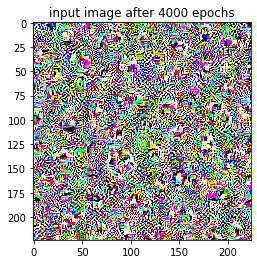

epoch: 5000/10000, activation: 118.13880157470703


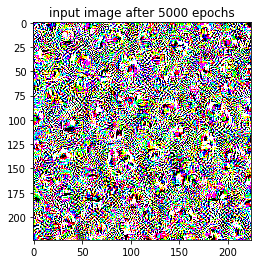

epoch: 6000/10000, activation: 141.3564453125


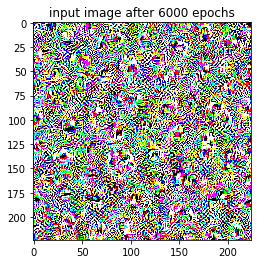

epoch: 7000/10000, activation: 164.7440643310547


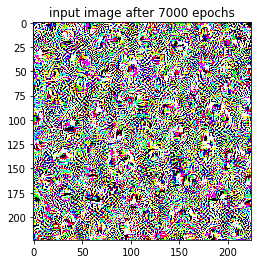

epoch: 8000/10000, activation: 188.3518829345703


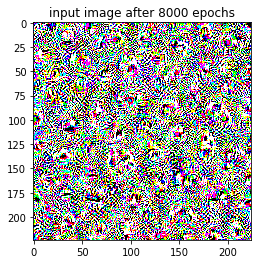

epoch: 9000/10000, activation: 212.0640106201172


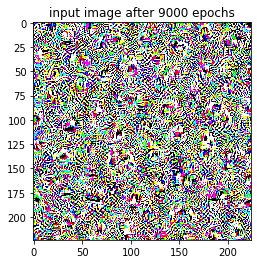

In [15]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 10000
display_every = 1000
unit_idx = 11 # unit of the convolution layer that we wish to visualize

for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    model(img_tensor.unsqueeze(0))
    layer_out = activation['4a']
    loss = -layer_out[0, unit_idx].mean() 
    loss.backward()
    optimizer.step()
    # normalize the updated img_tensor to have pytorch specified mean and std. dev.
    # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
    # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
    # Will have to understand this further  
    
    if epoch % display_every == 0:
        print('epoch: {}/{}, activation: {}'.format(epoch, num_epochs, -loss))
        plt.imshow(image_converter(img_tensor))
        plt.title('input image after {} epochs'.format(epoch))
        plt.show()


The final image does seeem to have some very high frequency patterns. However, the high frequency behaviour obscures any interpretation of what the neuron seems to learning. 

## Trial 2: Activation Maximization with slowly upscaling the image

I found that my code above is quite similar to the implementation of feature visualization with activation maximization in [this](https://towardsdatascience.com/how-to-visualize-convolutional-features-in-40-lines-of-code-70b7d87b0030) blog post. There the author also discusses the emerges of high frequence patterns in the image and how he got around it by initially feeding smaller sized images and slowing upscaling them. Let us try this.

In [9]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))

img_shape:(3, 224, 224), img_dtype: float32


In [10]:
upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 20 # no. of times to optimize an input image before upscaling

In [11]:
import cv2 # for resizing images
# Note that we could have also used torchvision.transforms.Resize() method provided in Pytorch
# we used cv2 for no particular reason other than to try cv2
# for more info on torchvision.transforms.Resize() see https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Resize


# e.g. of how to resize images using cv2
# just like in plt.imshow() cv2 also expects the channel info. to be in the last axis
# the documentation for cv2.resize() recommends using inter_cubic for interpolation when upscaling
cv2.resize(image_converter(img_tensor), dsize = (0,0) , fx = upscaling_factor, fy = upscaling_factor, 
           interpolation = cv2.INTER_CUBIC).shape 

(235, 235, 3)

In [87]:
# move the model to CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

Calculations being executed on cuda


GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

### Creating a initial image with random pixels

In [88]:
# initial random image
H = 28 # height of image
W = 28 # width of image
im = np.single(np.random.uniform(0, 1, (3, H, W))) # we need the pixel values to be of type float32 
img_tensor = normalize(torch.from_numpy(im)).to(device).requires_grad_(True)
print('image shape: {}, device: {}, dtype: {}'.format(img_tensor.shape, 
                                                      img_tensor.device, img_tensor.dtype ))

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.01)

image shape: torch.Size([3, 28, 28]), device: cuda:0, dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image 

begin mag_epoch 0, activation: 0.8882796168327332
end mag_epoch: 0, activation: 18.982938766479492


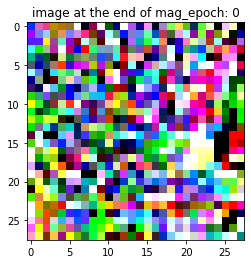

begin mag_epoch 1, activation: 5.743788719177246
end mag_epoch: 1, activation: 28.654890060424805


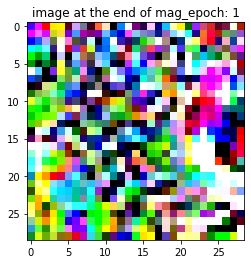

begin mag_epoch 2, activation: 8.629809379577637
end mag_epoch: 2, activation: 32.5224609375


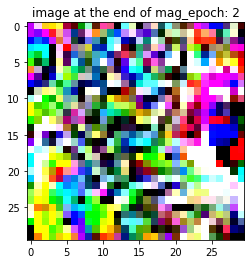

begin mag_epoch 3, activation: 4.184707164764404
end mag_epoch: 3, activation: 22.299091339111328


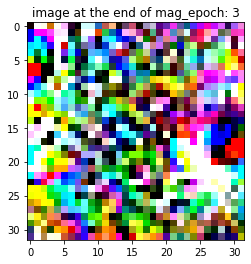

begin mag_epoch 4, activation: 6.04392147064209
end mag_epoch: 4, activation: 28.057294845581055


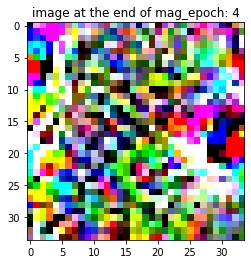

begin mag_epoch 5, activation: 6.82354211807251
end mag_epoch: 5, activation: 27.122568130493164


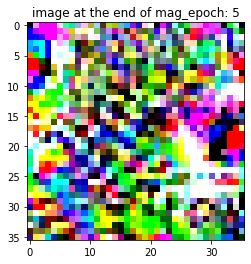

begin mag_epoch 6, activation: 7.177530288696289
end mag_epoch: 6, activation: 29.756702423095703


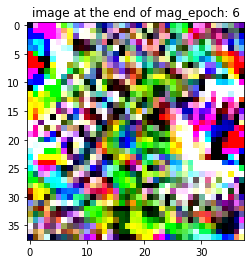

begin mag_epoch 7, activation: 6.488224506378174
end mag_epoch: 7, activation: 30.84030532836914


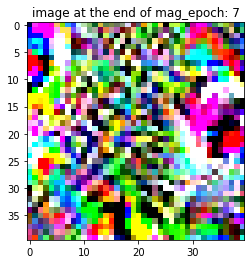

begin mag_epoch 8, activation: 8.483970642089844
end mag_epoch: 8, activation: 34.63468551635742


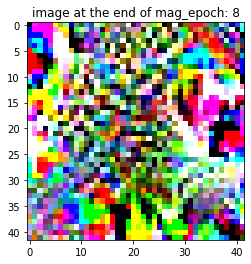

begin mag_epoch 9, activation: 8.771142959594727
end mag_epoch: 9, activation: 35.12010955810547


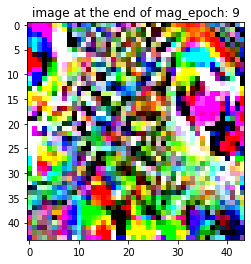

begin mag_epoch 10, activation: 8.456588745117188
end mag_epoch: 10, activation: 38.566898345947266


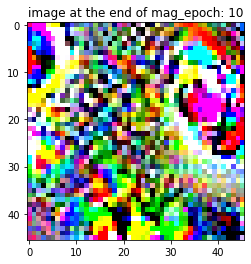

begin mag_epoch 11, activation: 5.634208679199219
end mag_epoch: 11, activation: 26.902503967285156


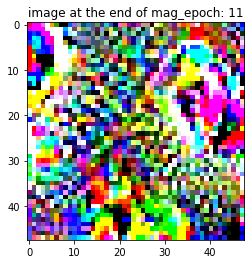

begin mag_epoch 12, activation: 6.296469211578369
end mag_epoch: 12, activation: 27.619821548461914


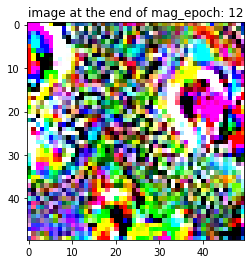

begin mag_epoch 13, activation: 6.495039939880371
end mag_epoch: 13, activation: 29.56787109375


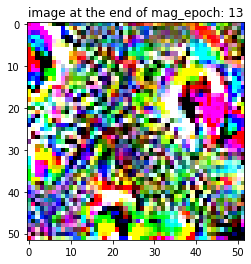

begin mag_epoch 14, activation: 5.179808616638184
end mag_epoch: 14, activation: 29.754297256469727


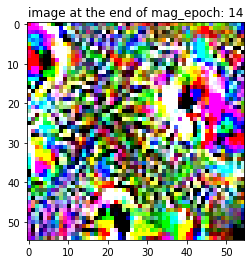

begin mag_epoch 15, activation: 6.036262035369873
end mag_epoch: 15, activation: 30.25357437133789


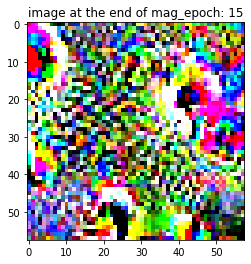

begin mag_epoch 16, activation: 6.855642318725586
end mag_epoch: 16, activation: 31.820369720458984


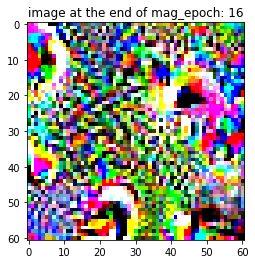

begin mag_epoch 17, activation: 5.08596134185791
end mag_epoch: 17, activation: 26.91208839416504


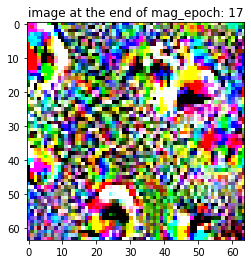

begin mag_epoch 18, activation: 5.611894607543945
end mag_epoch: 18, activation: 26.824539184570312


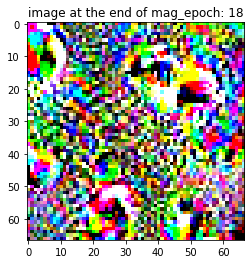

begin mag_epoch 19, activation: 5.170938968658447
end mag_epoch: 19, activation: 26.365673065185547


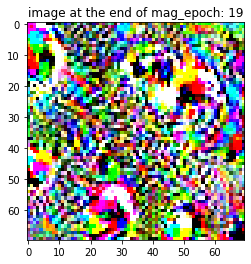

begin mag_epoch 20, activation: 5.695950984954834
end mag_epoch: 20, activation: 27.188928604125977


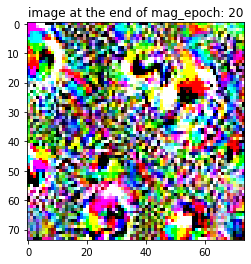

begin mag_epoch 21, activation: 5.975698471069336
end mag_epoch: 21, activation: 29.27399444580078


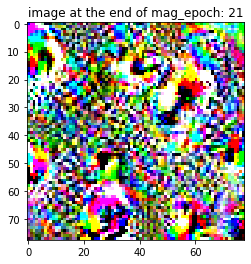

begin mag_epoch 22, activation: 5.142000675201416
end mag_epoch: 22, activation: 26.400259017944336


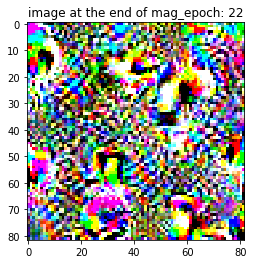

begin mag_epoch 23, activation: 5.326861381530762
end mag_epoch: 23, activation: 28.820209503173828


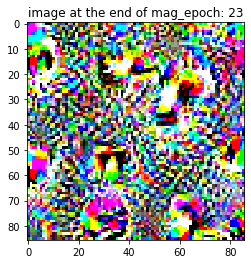

begin mag_epoch 24, activation: 6.482631683349609
end mag_epoch: 24, activation: 28.55868911743164


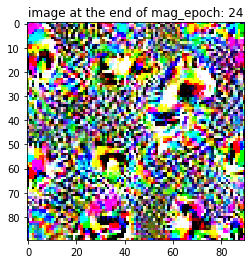

begin mag_epoch 25, activation: 6.105302810668945
end mag_epoch: 25, activation: 29.982345581054688


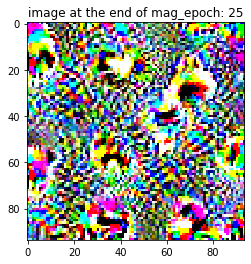

begin mag_epoch 26, activation: 5.1715288162231445
end mag_epoch: 26, activation: 25.656564712524414


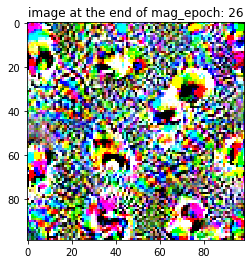

begin mag_epoch 27, activation: 6.016640663146973
end mag_epoch: 27, activation: 27.687551498413086


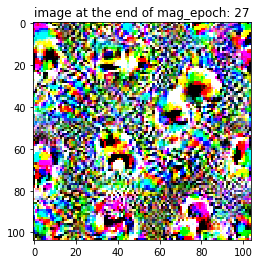

begin mag_epoch 28, activation: 6.077055931091309
end mag_epoch: 28, activation: 28.592041015625


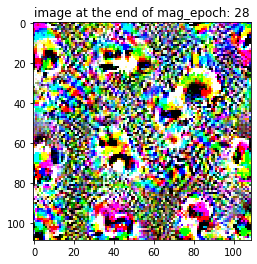

begin mag_epoch 29, activation: 5.299001216888428
end mag_epoch: 29, activation: 25.623640060424805


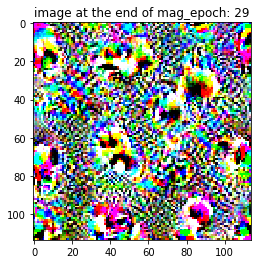

begin mag_epoch 30, activation: 5.166896820068359
end mag_epoch: 30, activation: 26.8083438873291


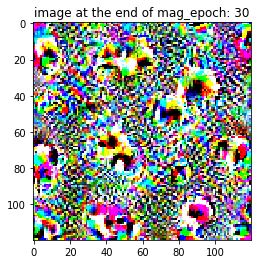

begin mag_epoch 31, activation: 5.711336135864258
end mag_epoch: 31, activation: 28.378477096557617


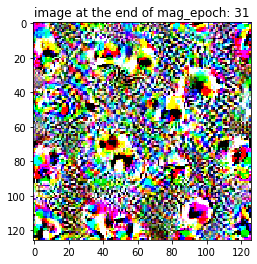

begin mag_epoch 32, activation: 5.179440498352051
end mag_epoch: 32, activation: 27.43035888671875


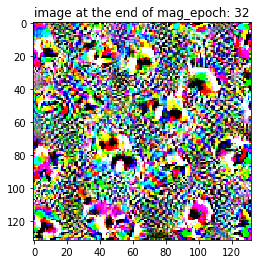

begin mag_epoch 33, activation: 5.427289962768555
end mag_epoch: 33, activation: 27.565174102783203


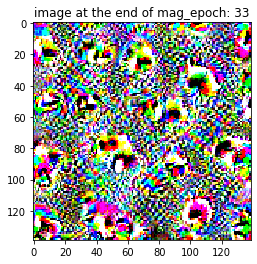

begin mag_epoch 34, activation: 5.10068941116333
end mag_epoch: 34, activation: 25.611059188842773


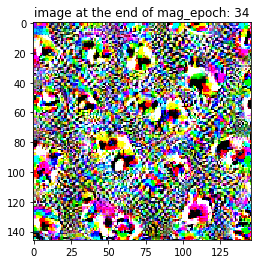

begin mag_epoch 35, activation: 5.224944591522217
end mag_epoch: 35, activation: 26.014461517333984


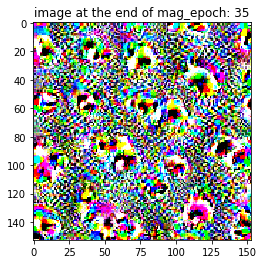

begin mag_epoch 36, activation: 4.877203464508057
end mag_epoch: 36, activation: 26.358816146850586


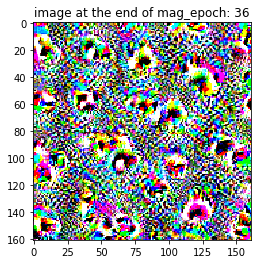

begin mag_epoch 37, activation: 5.082779884338379
end mag_epoch: 37, activation: 26.680631637573242


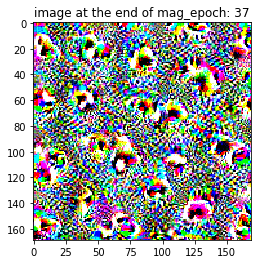

begin mag_epoch 38, activation: 5.094511985778809
end mag_epoch: 38, activation: 25.465898513793945


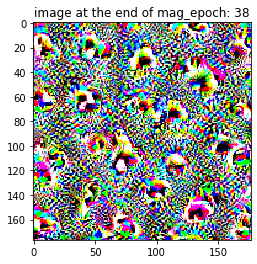

begin mag_epoch 39, activation: 5.110651969909668
end mag_epoch: 39, activation: 26.656837463378906


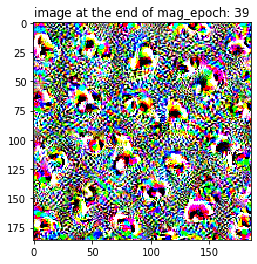

begin mag_epoch 40, activation: 5.006280422210693
end mag_epoch: 40, activation: 26.297821044921875


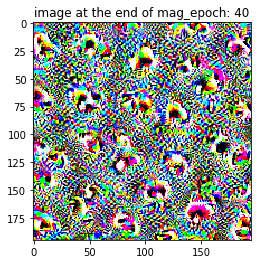

begin mag_epoch 41, activation: 5.062628269195557
end mag_epoch: 41, activation: 26.9825439453125


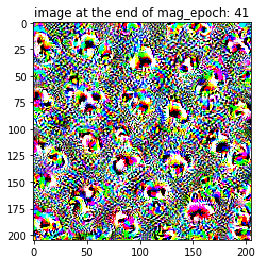

begin mag_epoch 42, activation: 4.88804292678833
end mag_epoch: 42, activation: 26.796777725219727


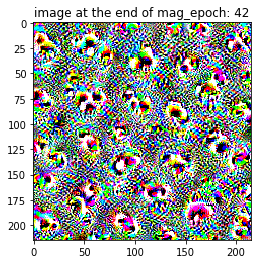

begin mag_epoch 43, activation: 4.706080913543701
end mag_epoch: 43, activation: 26.110937118530273


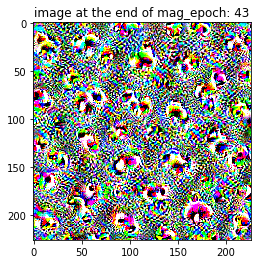

begin mag_epoch 44, activation: 5.037359237670898
end mag_epoch: 44, activation: 27.13153648376465


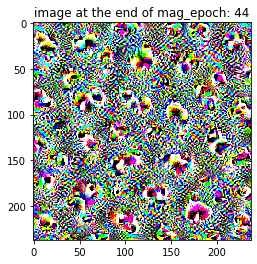

begin mag_epoch 45, activation: 4.771661281585693
end mag_epoch: 45, activation: 26.615734100341797


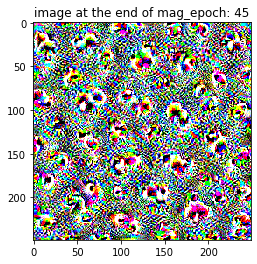

In [89]:
unit_idx = 11 # the neuron to visualize

model.eval()
for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr = 0.4)
    
    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()
        model(img_tensor.unsqueeze(0))
        layer_out = activation['4a']
        loss = -layer_out[0, unit_idx].mean()
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, -loss))
        loss.backward()
        optimizer.step()
        
    # view the result of optimising the image
    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, -loss))
    img = image_converter(img_tensor)    
    plt.imshow(img)
    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    plt.show()
    
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

In [90]:
img_tensor.shape

torch.Size([3, 261, 261])

Simply scaling up the image slowly does not seem ameliorate the issue :(

## Trial 3: Activation maximization with RMS activation

In my experiments so far, I had defined activation of a unit to be the average of the elements in the output tensor of that unit. Loss was then defined to be the negative of this activation. Let me consider a new definition of activation: root-mean-squared value of the elements in the output tensor.

### Generating an inital random image

In [23]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))

img_shape:(3, 224, 224), img_dtype: float32


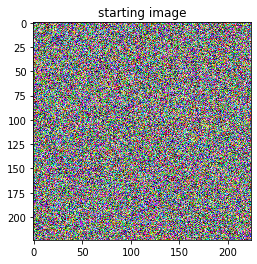

In [24]:
# Starting Image
plt.imshow(image_converter(img_tensor))                                                               
plt.title('starting image')
plt.show()

In [25]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)
img_tensor = img_tensor.to(device).requires_grad_(True) # move the image tensor to cuda 
                                                        # set its requires_grad_ flag to be true

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.01)

Calculations being executed on cuda
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image

epoch: 0/10000, activation: 0.04625428467988968


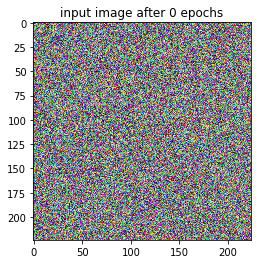

epoch: 1000/10000, activation: 30.478178024291992


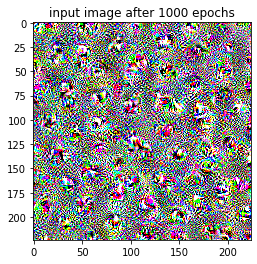

epoch: 2000/10000, activation: 52.91881561279297


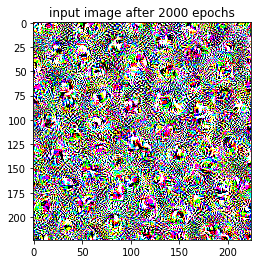

epoch: 3000/10000, activation: 75.82505798339844


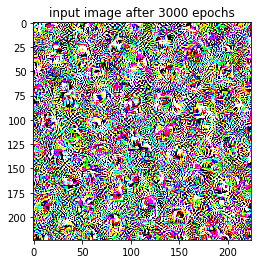

epoch: 4000/10000, activation: 99.19580841064453


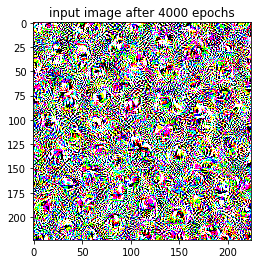

epoch: 5000/10000, activation: 122.96466064453125


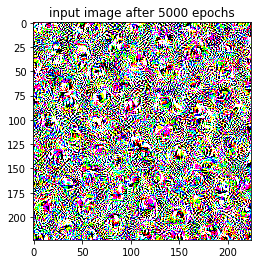

epoch: 6000/10000, activation: 146.92515563964844


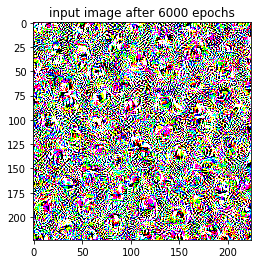

epoch: 7000/10000, activation: 171.2114715576172


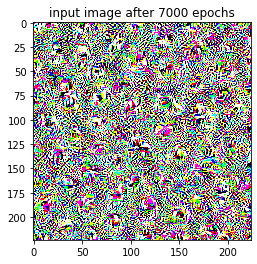

epoch: 8000/10000, activation: 195.7802734375


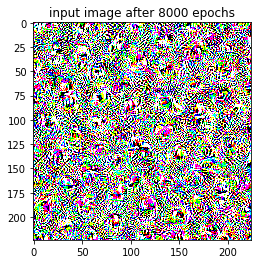

epoch: 9000/10000, activation: 220.46160888671875


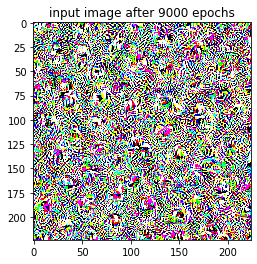

In [26]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 10000
display_every = 1000
unit_idx = 11 # unit of the convolution layer that we wish to visualize

for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    model(img_tensor.unsqueeze(0))
    layer_out = activation['4a']
    rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
    loss = - rms
    loss.backward()
    optimizer.step()
    # normalize the updated img_tensor to have pytorch specified mean and std. dev.
    # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
    # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
    # Will have to understand this further  
    
    if epoch % display_every == 0:
        print('epoch: {}/{}, activation: {}'.format(epoch, num_epochs, -loss))
        plt.imshow(image_converter(img_tensor))
        plt.title('input image after {} epochs'.format(epoch))
        plt.show()

This does not help either!

## Trial 4: Activation Maximization with Regularization

Various papers such as [this](https://arxiv.org/pdf/1312.6034.pdf), [this](https://arxiv.org/pdf/1512.02017.pdf) and [this](https://arxiv.org/pdf/1904.08939.pdf) have stressed on the need for regularization in order to obtain interpretable results from activation maximization. For starters, let's try an L2-regularization on pixel values as was done in [this](https://arxiv.org/pdf/1312.6034.pdf) paper. 

### Generating an inital random image

In [12]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
img_mean = [img[idx].mean() for idx in range(3)]
img_dev = [img[idx].std() for idx in range(3)]
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype))
print("mean: {}, std_dev: {}".format(img_mean, img_dev ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))
norm_img_mean = [img_tensor[idx].mean().item() for idx in range(3)]
norm_img_dev = [img_tensor[idx].std().item() for idx in range(3)]
print("mean of normalized image: {}".format(norm_img_mean))
print("std. dev of normalized image: {}".format(norm_img_dev))

img_shape:(3, 224, 224), img_dtype: float32
mean: [0.49853072, 0.49987054, 0.4993449], std_dev: [0.28839156, 0.2886475, 0.28970343]
mean of normalized image: [0.059085968881845474, 0.19585047662258148, 0.41486623883247375]
std. dev of normalized image: [1.2593642473220825, 1.2886176109313965, 1.2875837087631226]


In [13]:
(0.5000887-0.485)/(0.229)

0.0658895196506553

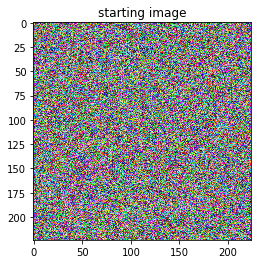

In [79]:
# Starting Image
plt.imshow(image_converter(img_tensor))                                                               
plt.title('starting image')
plt.show()

In [80]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)
#img_tensor = img_tensor.to(device).requires_grad_(True) # move the image tensor to cuda 
                                                        # set its requires_grad_ flag to be true

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
#print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
#print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

#optimizer = optim.Adam([img_tensor], lr = 0.01)

Calculations being executed on cuda


GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

### Generating the final image

Optimization for pixel regularization constant: 0, initial activation: 0.04853007569909096
pixel regularization constant: 0, activation: 15.00914478302002


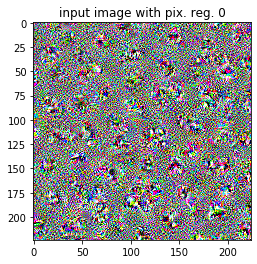

Optimization for pixel regularization constant: 5, initial activation: 0.04853007569909096
pixel regularization constant: 5, activation: 14.062283515930176


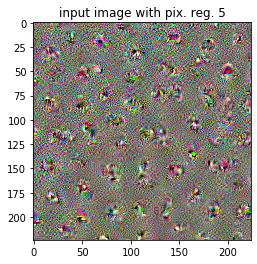

Optimization for pixel regularization constant: 10, initial activation: 0.04853007569909096
pixel regularization constant: 10, activation: 13.149080276489258


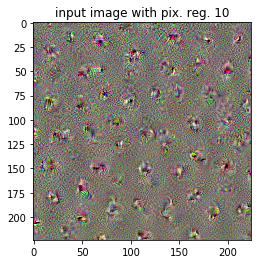

Optimization for pixel regularization constant: 15, initial activation: 0.04853007569909096
pixel regularization constant: 15, activation: 12.750381469726562


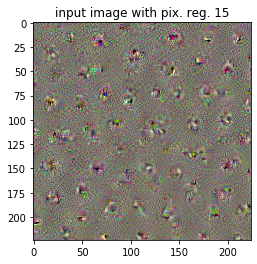

Optimization for pixel regularization constant: 20, initial activation: 0.04853007569909096
pixel regularization constant: 20, activation: 12.191788673400879


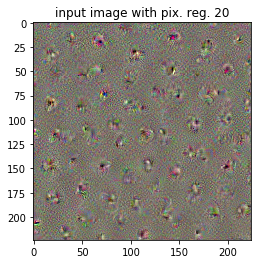

Optimization for pixel regularization constant: 25, initial activation: 0.04853007569909096
pixel regularization constant: 25, activation: 11.738006591796875


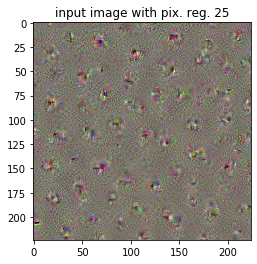

Optimization for pixel regularization constant: 30, initial activation: 0.04853007569909096
pixel regularization constant: 30, activation: 11.562224388122559


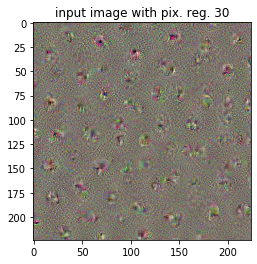

In [83]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 300
unit_idx = 11 # unit of the convolution layer that we wish to visualize
pix_reg_high = 30 # upper bound on regularization constants for pixel intensities
pix_reg_step = 5 # step size by which to increase pixel regularizer in each step
lr = 0.01 # learning rate 

for pix_reg in range(0, pix_reg_high+1, pix_reg_step):
    image = img_tensor.clone().detach().to(device).requires_grad_(True)
    optimizer = optim.Adam([image], lr = lr)
    
    # act. value before optimization
    optimizer.zero_grad()
    model(image.unsqueeze(0))
    layer_out = activation['4a']
    rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
    print('Optimization for pixel regularization constant: {}, initial activation: {}'.format(pix_reg, rms))
    
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        model(image.unsqueeze(0))
        layer_out = activation['4a']
        rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
        loss = - rms + pix_reg*((image**2).mean())
        loss.backward()
        optimizer.step()
        # normalize the updated img_tensor to have pytorch specified mean and std. dev.
        # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
        # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
        # Will have to understand this further  
    
    # display the image generated for each value of pix_reg  
    print('pixel regularization constant: {}, activation: {}'.format(pix_reg, rms))
    plt.imshow(image_converter(image))
    plt.title('input image with pix. reg. {}'.format(pix_reg))
    plt.show()

Just adding an L2 regularizer for pixel intensities also does not seem to help much, except that it suppresses the background of the final image. 

## Trial 5: Activation Maximization with scaling and L2 reg. for pixel intensity

Let us try to combine the techniques in Trial 2 and 4

In [14]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))

img_shape:(3, 224, 224), img_dtype: float32


In [15]:
upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 50 # no. of times to optimize an input image before upscaling

In [16]:
import cv2 # for resizing images
# Note that we could have also used torchvision.transforms.Resize() method provided in Pytorch
# we used cv2 for no particular reason other than to try cv2
# for more info on torchvision.transforms.Resize() see https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Resize


# e.g. of how to resize images using cv2
# just like in plt.imshow() cv2 also expects the channel info. to be in the last axis
# the documentation for cv2.resize() recommends using inter_cubic for interpolation when upscaling
cv2.resize(image_converter(img_tensor), dsize = (0,0) , fx = upscaling_factor, fy = upscaling_factor, 
           interpolation = cv2.INTER_CUBIC).shape 

(235, 235, 3)

In [34]:
# move the model to CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

Calculations being executed on cuda


GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

### Creating a initial image with random pixels

In [37]:
# initial random image
H = 28 # height of image
W = 28 # width of image
im = np.single(np.random.uniform(0, 1, (3, H, W))) # we need the pixel values to be of type float32 
img_tensor = normalize(torch.from_numpy(im)).to(device).requires_grad_(True)
print('image shape: {}, device: {}, dtype: {}'.format(img_tensor.shape, 
                                                      img_tensor.device, img_tensor.dtype ))

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.01)

image shape: torch.Size([3, 28, 28]), device: cuda:0, dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image 

begin mag_epoch 0, activation: -16.932294845581055
end mag_epoch: 0, activation: 14.016914367675781


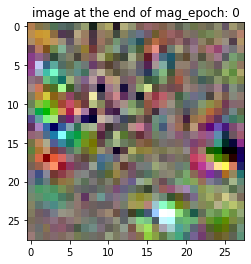

begin mag_epoch 1, activation: 7.002843856811523
end mag_epoch: 1, activation: 15.783018112182617


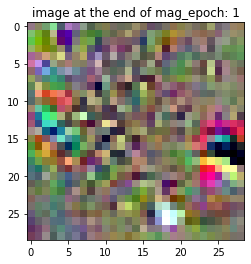

begin mag_epoch 2, activation: 6.496635437011719
end mag_epoch: 2, activation: 16.332744598388672


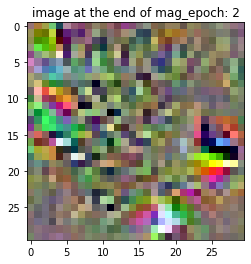

begin mag_epoch 3, activation: 1.0011656284332275
end mag_epoch: 3, activation: 12.70689582824707


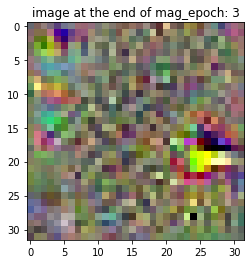

begin mag_epoch 4, activation: 4.640948295593262
end mag_epoch: 4, activation: 12.857855796813965


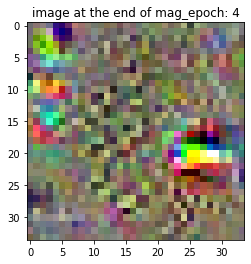

begin mag_epoch 5, activation: 3.829772472381592
end mag_epoch: 5, activation: 13.660022735595703


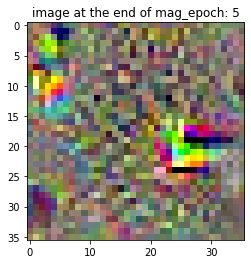

begin mag_epoch 6, activation: 4.2377495765686035
end mag_epoch: 6, activation: 16.113414764404297


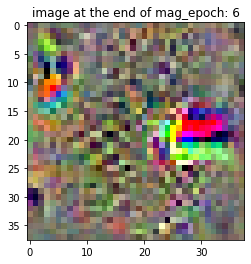

begin mag_epoch 7, activation: 4.0209455490112305
end mag_epoch: 7, activation: 17.642230987548828


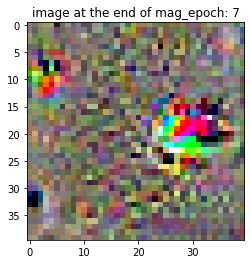

begin mag_epoch 8, activation: 4.793230056762695
end mag_epoch: 8, activation: 15.526906967163086


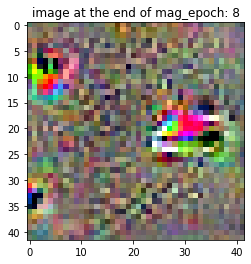

begin mag_epoch 9, activation: 6.008821487426758
end mag_epoch: 9, activation: 16.973453521728516


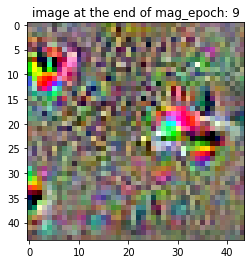

begin mag_epoch 10, activation: 5.085119247436523
end mag_epoch: 10, activation: 16.715028762817383


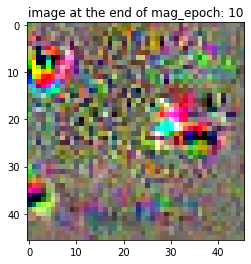

begin mag_epoch 11, activation: 2.7940406799316406
end mag_epoch: 11, activation: 12.414907455444336


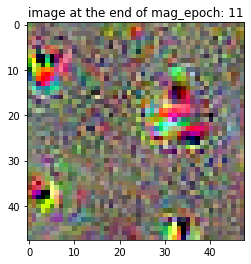

begin mag_epoch 12, activation: 4.783380508422852
end mag_epoch: 12, activation: 14.235508918762207


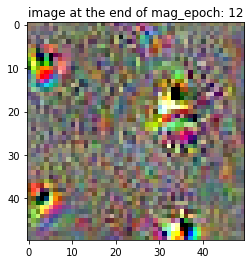

begin mag_epoch 13, activation: 4.7032270431518555
end mag_epoch: 13, activation: 15.573260307312012


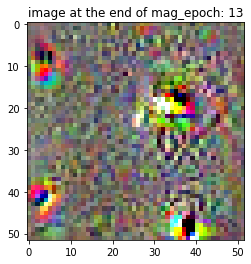

begin mag_epoch 14, activation: 4.265048027038574
end mag_epoch: 14, activation: 16.68912696838379


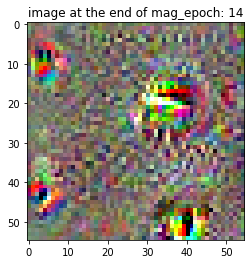

begin mag_epoch 15, activation: 4.171184539794922
end mag_epoch: 15, activation: 17.690223693847656


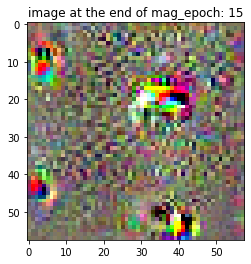

begin mag_epoch 16, activation: 4.687100410461426
end mag_epoch: 16, activation: 16.431352615356445


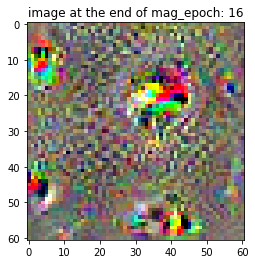

begin mag_epoch 17, activation: 2.893430709838867
end mag_epoch: 17, activation: 13.498769760131836


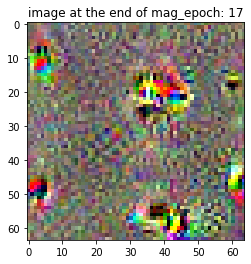

begin mag_epoch 18, activation: 3.336568593978882
end mag_epoch: 18, activation: 14.715938568115234


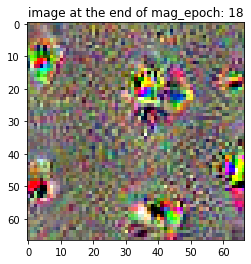

begin mag_epoch 19, activation: 3.076327085494995
end mag_epoch: 19, activation: 14.77053451538086


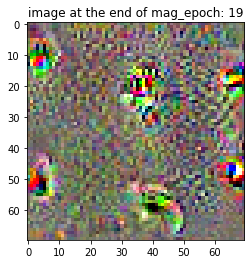

begin mag_epoch 20, activation: 3.2812342643737793
end mag_epoch: 20, activation: 15.704850196838379


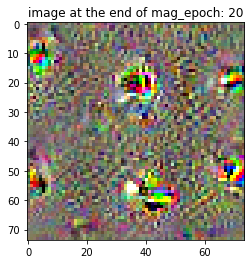

begin mag_epoch 21, activation: 3.806145668029785
end mag_epoch: 21, activation: 16.606731414794922


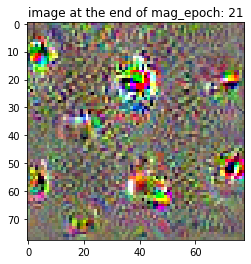

begin mag_epoch 22, activation: 2.5630335807800293
end mag_epoch: 22, activation: 14.83917236328125


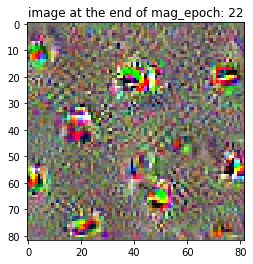

begin mag_epoch 23, activation: 4.398715972900391
end mag_epoch: 23, activation: 16.951745986938477


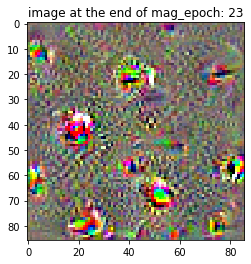

begin mag_epoch 24, activation: 3.400869369506836
end mag_epoch: 24, activation: 15.429943084716797


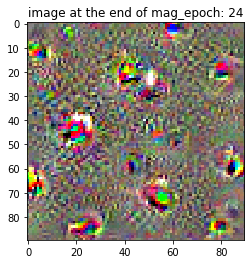

begin mag_epoch 25, activation: 4.114408493041992
end mag_epoch: 25, activation: 17.634803771972656


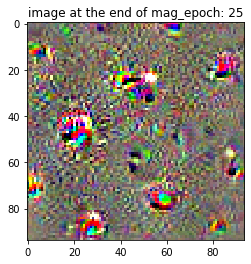

begin mag_epoch 26, activation: 2.6079750061035156
end mag_epoch: 26, activation: 14.975850105285645


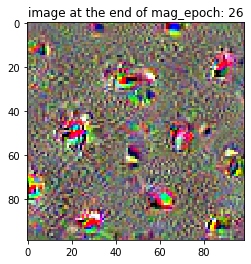

begin mag_epoch 27, activation: 3.723342180252075
end mag_epoch: 27, activation: 15.217679977416992


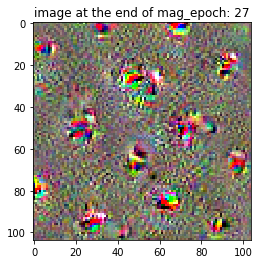

begin mag_epoch 28, activation: 3.906513214111328
end mag_epoch: 28, activation: 15.692323684692383


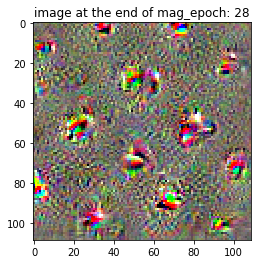

begin mag_epoch 29, activation: 3.1581482887268066
end mag_epoch: 29, activation: 15.461739540100098


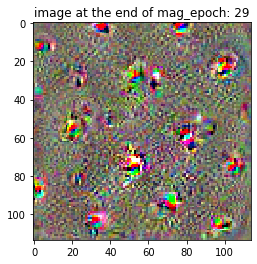

begin mag_epoch 30, activation: 3.4513487815856934
end mag_epoch: 30, activation: 16.636871337890625


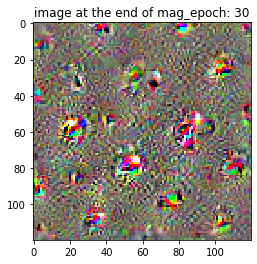

begin mag_epoch 31, activation: 3.3942155838012695
end mag_epoch: 31, activation: 18.019933700561523


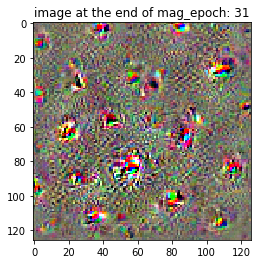

begin mag_epoch 32, activation: 2.7647030353546143
end mag_epoch: 32, activation: 16.19331932067871


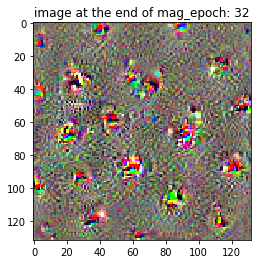

begin mag_epoch 33, activation: 3.2025704383850098
end mag_epoch: 33, activation: 16.1422176361084


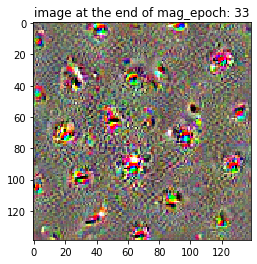

begin mag_epoch 34, activation: 2.8460147380828857
end mag_epoch: 34, activation: 16.690677642822266


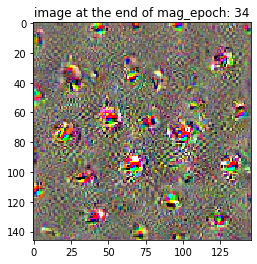

begin mag_epoch 35, activation: 3.017090082168579
end mag_epoch: 35, activation: 16.989768981933594


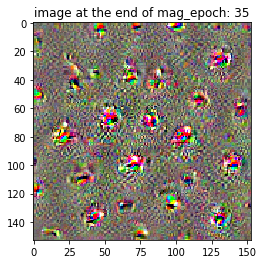

begin mag_epoch 36, activation: 2.5316929817199707
end mag_epoch: 36, activation: 16.215686798095703


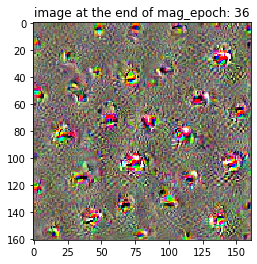

begin mag_epoch 37, activation: 3.0672757625579834
end mag_epoch: 37, activation: 17.419506072998047


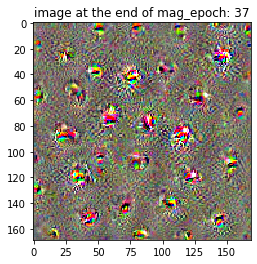

begin mag_epoch 38, activation: 2.808881998062134
end mag_epoch: 38, activation: 16.699838638305664


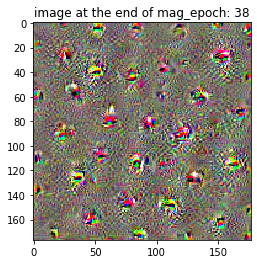

begin mag_epoch 39, activation: 3.3136961460113525
end mag_epoch: 39, activation: 17.20964813232422


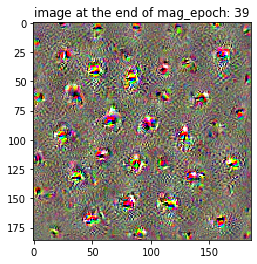

begin mag_epoch 40, activation: 2.9974474906921387
end mag_epoch: 40, activation: 17.131303787231445


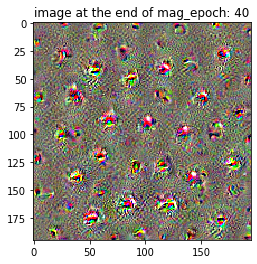

begin mag_epoch 41, activation: 3.2177371978759766
end mag_epoch: 41, activation: 17.16241455078125


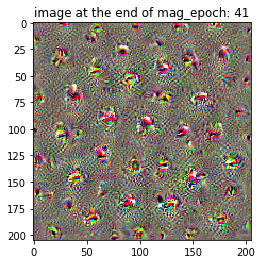

begin mag_epoch 42, activation: 2.914679527282715
end mag_epoch: 42, activation: 17.021207809448242


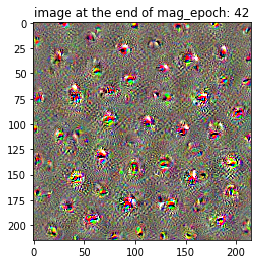

begin mag_epoch 43, activation: 2.8200111389160156
end mag_epoch: 43, activation: 16.748825073242188


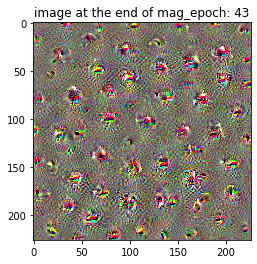

begin mag_epoch 44, activation: 3.2511329650878906
end mag_epoch: 44, activation: 17.532560348510742


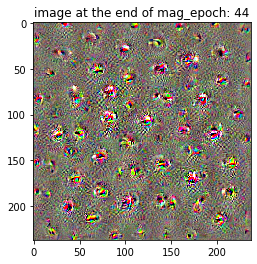

begin mag_epoch 45, activation: 2.939990997314453
end mag_epoch: 45, activation: 17.083084106445312


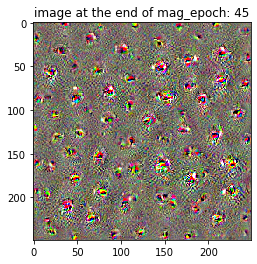

In [38]:
unit_idx = 11 # the neuron to visualize
pix_reg = 10

model.eval()
for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr = 0.4)
    
    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()
        model(img_tensor.unsqueeze(0))
        layer_out = activation['4a']
        rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
        loss = -rms + pix_reg*((img_tensor**2).mean())
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, -loss))
        loss.backward()
        optimizer.step()
        
    # view the result of optimising the image
    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, -loss))
    img = image_converter(img_tensor)    
    plt.imshow(img)
    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    plt.show()
    
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

In [39]:
img_tensor.shape

torch.Size([3, 261, 261])

### Trial 6: Regularizing image gradients

As advocated in [this](https://arxiv.org/pdf/1412.0035.pdf) in this paper, regularizing the gradients in the image helps produce more human interpretable structures.

### Computing image gradients for a gray scale image with a single color channel

In [35]:
import cv2 
import sys # to use sys.exit() for terminating the code if nans arise during computations
           # See the discussion on the following stackoverflow post
           # https://stackoverflow.com/questions/19747371/python-exit-commands-why-so-many-and-when-should-each-be-used

In [13]:
# Use cv2 to compute image gradients
# This is to verify our implementation of image gradients using conv. layers
# We can not be use these during backpropagation, hence the need to define our own function
# Due to differences in how boundary pixels are handled we only expect the results to match for non-boundary pixels


# function to compute image gradients using cv2
# we will make use of the Scharr filters provided in cv2
# the image passed to this function is supposed to have the color channels as its first dimension
def image_gradients(img):
    num_channels = img.shape[0]
    ddepth = cv2.CV_64F
    x_grad = []
    y_grad = []
    for chnl in range(num_channels):
        x_grad.append(cv2.Scharr(img[chnl], ddepth, dx = 1, dy = 0))
        y_grad.append(cv2.Scharr(img[chnl], ddepth, dx = 0, dy = 1))
    x_grad = np.single(np.array(x_grad))
    y_grad = np.single(np.array(y_grad))
    return x_grad, y_grad

In [14]:
import torch.nn as nn

In [15]:
# Scharr Filters
# for e.g. see https://docs.opencv.org/2.4/doc/tutorials/imgproc/imgtrans/sobel_derivatives/sobel_derivatives.html#formulation
filter_x = np.array([[-3, 0, 3], 
                     [-10, 0, 10],
                     [-3, 0, 3]])

filter_y = filter_x.T
grad_filters = np.array([filter_x, filter_y])

In [16]:
grad_filters.shape[1:]

(3, 3)

In [17]:
# class to compute image gradients in pytorch
class gradients(nn.Module):
    def __init__(self, weight):
        super().__init__()
        k_height, k_width = weight.shape[2:]
        # assuming that the height and width of the kernel are always odd numbers
        padding_x = int((k_height-1)/2)
        padding_y = int((k_width-1)/2)
        
        # convolutional layer with 2 output channels corresponding to the x and the y gradients
        self.conv = nn.Conv2d(1, 2, (k_height, k_width), bias = False, 
                              padding = (padding_x, padding_y) )
        # initialize the weights of the convolutional layer to be the one provided
        if self.conv.weight.shape == weight.shape:
            self.conv.weight = nn.Parameter(weight)
            self.conv.weight.requires_grad_(False)
        else:
            print('Error: The shape of the given weights is not correct')
    
    def forward(self, x):
        return self.conv(x)              

In [18]:
gradLayer = gradients(torch.from_numpy(grad_filters).unsqueeze(1).type(torch.FloatTensor))
gradLayer

gradients(
  (conv): Conv2d(1, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
)

In [19]:
# generating the random image with random pixel values between 0 and 1
H = 5 # height of input image
W = 5 # width of input image
img = np.single(np.random.uniform(0,1, (1, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = torch.from_numpy(img)
img_tensor

img_shape:(1, 5, 5), img_dtype: float32


tensor([[[0.0388, 0.1004, 0.0486, 0.0843, 0.7179],
         [0.5388, 0.4142, 0.1173, 0.6618, 0.0379],
         [0.5258, 0.5700, 0.5012, 0.8992, 0.1808],
         [0.6842, 0.1635, 0.1017, 0.1300, 0.6344],
         [0.1908, 0.4828, 0.0571, 0.9255, 0.0705]]])

In [20]:
image_gradients(img)[0][0, 1:4, 1:4]-gradLayer(img_tensor.unsqueeze(0)).numpy()[0, 0, 1:4, 1:4]

array([[ 4.7683716e-07, -2.3841858e-07, -5.9604645e-08],
       [ 0.0000000e+00, -4.7683716e-07,  0.0000000e+00],
       [-4.7683716e-07, -1.1920929e-07,  0.0000000e+00]], dtype=float32)

Hurrah! The difference between x_grad as computed by us and through cv2 is extremely tiny for non-boundary kernels.

In [21]:
image_gradients(img)[1][0, 1:4, 1:4]-gradLayer(img_tensor.unsqueeze(0)).numpy()[0, 1, 1:4, 1:4]

array([[ 0.0000000e+00,  0.0000000e+00,  4.7683716e-07],
       [ 0.0000000e+00,  2.3841858e-07, -2.3841858e-07],
       [ 2.3841858e-07, -4.7683716e-07, -3.5762787e-07]], dtype=float32)

Hurrah! The difference between y_grad as computed by us and through cv2 is extremely tiny for non-boundary kernels.

### Computing image gradients for an RGB image i.e. having 3 color channels

In [22]:
# class to compute image gradients in pytorch
class RGBgradients(nn.Module):
    def __init__(self, weight): # weight is a numpy array
        super().__init__()
        k_height, k_width = weight.shape[1:]
        # assuming that the height and width of the kernel are always odd numbers
        padding_x = int((k_height-1)/2)
        padding_y = int((k_width-1)/2)
        
        # convolutional layer with 3 in_channels and 6 out_channels 
        # the 3 in_channels are the color channels of the image
        # for each in_channel we have 2 out_channels corresponding to the x and the y gradients
        self.conv = nn.Conv2d(3, 6, (k_height, k_width), bias = False, 
                              padding = (padding_x, padding_y) )
        # initialize the weights of the convolutional layer to be the one provided
        # the weights correspond to the x/y filter for the channel in question and zeros for other channels
        weight1x = np.array([weight[0], 
                             np.zeros((k_height, k_width)), 
                             np.zeros((k_height, k_width))]) # x-derivative for 1st in_channel
        
        weight1y = np.array([weight[1], 
                             np.zeros((k_height, k_width)), 
                             np.zeros((k_height, k_width))]) # y-derivative for 1st in_channel
        
        weight2x = np.array([np.zeros((k_height, k_width)),
                             weight[0],
                             np.zeros((k_height, k_width))]) # x-derivative for 2nd in_channel
        
        weight2y = np.array([np.zeros((k_height, k_width)), 
                             weight[1],
                             np.zeros((k_height, k_width))]) # y-derivative for 2nd in_channel
        
        
        weight3x = np.array([np.zeros((k_height, k_width)),
                             np.zeros((k_height, k_width)),
                             weight[0]]) # x-derivative for 3rd in_channel
        
        weight3y = np.array([np.zeros((k_height, k_width)),
                             np.zeros((k_height, k_width)), 
                             weight[1]]) # y-derivative for 3rd in_channel
        
        weight_final = torch.from_numpy(np.array([weight1x, weight1y, 
                                                  weight2x, weight2y,
                                                  weight3x, weight3y])).type(torch.FloatTensor)
        
        if self.conv.weight.shape == weight_final.shape:
            self.conv.weight = nn.Parameter(weight_final)
            self.conv.weight.requires_grad_(False)
        else:
            print('Error: The shape of the given weights is not correct')
    
    # Note that a second way to define the conv. layer here would be to pass group = 3 when calling torch.nn.Conv2d
    
    def forward(self, x):
        return self.conv(x) 

In [23]:
gradLayer = RGBgradients(grad_filters)

In [24]:
gradLayer.conv.weight.shape

torch.Size([6, 3, 3, 3])

In [25]:
# move the model to CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

Calculations being executed on cuda


GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [27]:
device

device(type='cuda')

In [64]:
# function to compute gradient loss of an image using the above defined class 'gradients'
def grad_loss(img, grad_filters = grad_filters, beta = 1, device = device):
    # create an instance of the class 'gradients' with the given filters
    gradLayer = RGBgradients(grad_filters)
    # move the gradLayer to cuda
    gradLayer.to(device)
    gradSq = gradLayer(img.unsqueeze(0))**2
    
    # The following was an earlier definition of grad_loss based on Mahendran & Vedaldi's paper
    # For me this seems to give rise to Nan's whose source I am unable to locate 
    # so using a simpler grad_loss instead
    #grad_loss = 1/3 * (torch.pow(gradSq[0,0]+gradSq[0,1], beta/2) 
    #                   + torch.pow(gradSq[0,2]+gradSq[0,3], beta/2) 
    #                   + torch.pow(gradSq[0,4]+gradSq[0,5], beta/2)).mean()
    
    grad_loss = torch.pow(gradSq.mean(), beta/2)
    
    return grad_loss

In [65]:
# generating a random image with random pixel values between 0 and 1
H = 3 # height of input image
W = 3 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = torch.from_numpy(img).requires_grad_(True).to(device)
img_tensor

img_shape:(3, 3, 3), img_dtype: float32


tensor([[[0.6417, 0.6988, 0.0636],
         [0.8931, 0.0094, 0.9888],
         [0.9550, 0.1482, 0.6583]],

        [[0.6403, 0.0110, 0.3927],
         [0.5706, 0.2682, 0.6923],
         [0.5936, 0.5462, 0.7546]],

        [[0.7332, 0.0099, 0.8322],
         [0.0675, 0.1691, 0.3519],
         [0.5298, 0.2396, 0.8245]]], device='cuda:0', grad_fn=<CopyBackwards>)

In [66]:
grad_loss(img_tensor)

tensor(4.7399, device='cuda:0', grad_fn=<PowBackward0>)

### Creating a initial image with random pixels

In [82]:
# initial random image
H = 28 # height of image
W = 28 # width of image
im = np.single(np.random.uniform(0, 1, (3, H, W))) # we need the pixel values to be of type float32 
img_tensor = normalize(torch.from_numpy(im)).to(device).requires_grad_(True)
print('image shape: {}, device: {}, dtype: {}'.format(img_tensor.shape, 
                                                      img_tensor.device, img_tensor.dtype ))

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.001)

image shape: torch.Size([3, 28, 28]), device: cuda:0, dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image 

In [83]:
upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 100 # no. of times to optimize an input image before upscaling

begin mag_epoch 0, activation: 1.2455369234085083
end mag_epoch: 0, activation: 3.159414291381836


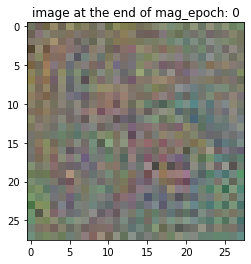

begin mag_epoch 1, activation: 2.1399986743927
end mag_epoch: 1, activation: 2.9267797470092773


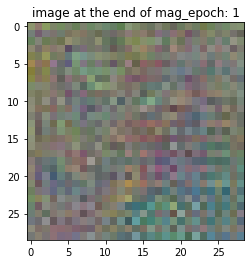

begin mag_epoch 2, activation: 2.1098685264587402
end mag_epoch: 2, activation: 3.002426862716675


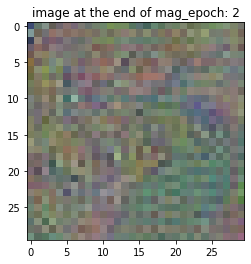

begin mag_epoch 3, activation: 1.6312016248703003
end mag_epoch: 3, activation: 3.2132861614227295


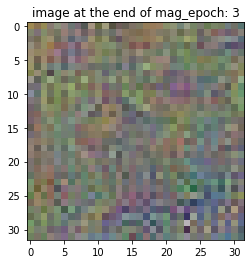

begin mag_epoch 4, activation: 1.8519545793533325
end mag_epoch: 4, activation: 2.9536173343658447


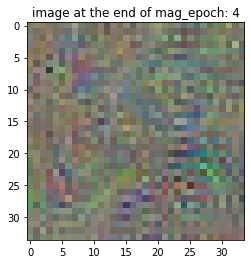

begin mag_epoch 5, activation: 1.8498047590255737
end mag_epoch: 5, activation: 3.8119359016418457


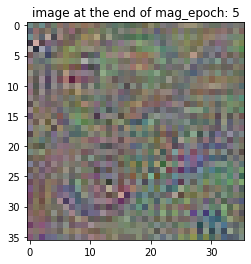

begin mag_epoch 6, activation: 2.0468826293945312
end mag_epoch: 6, activation: 3.374094247817993


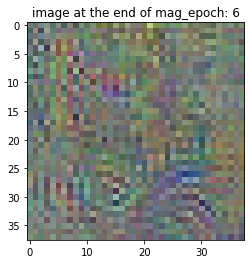

begin mag_epoch 7, activation: 1.0479267835617065
end mag_epoch: 7, activation: 3.4089512825012207


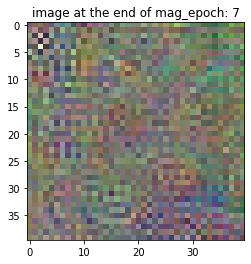

begin mag_epoch 8, activation: 1.5623871088027954
end mag_epoch: 8, activation: 3.3623268604278564


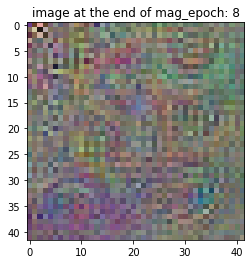

begin mag_epoch 9, activation: 1.5942531824111938
end mag_epoch: 9, activation: 3.8023383617401123


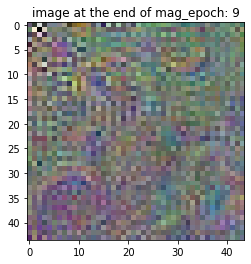

begin mag_epoch 10, activation: 1.9400320053100586
end mag_epoch: 10, activation: 3.954606294631958


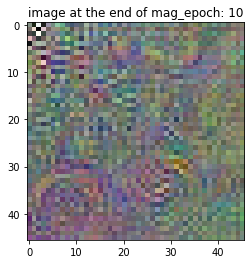

begin mag_epoch 11, activation: 1.4952750205993652
end mag_epoch: 11, activation: 3.8408963680267334


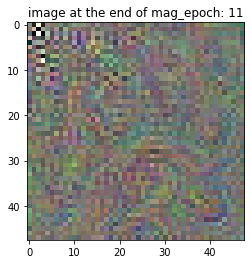

begin mag_epoch 12, activation: 1.907927393913269
end mag_epoch: 12, activation: 3.725477933883667


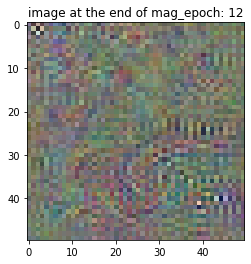

begin mag_epoch 13, activation: 1.9882550239562988
end mag_epoch: 13, activation: 4.670928955078125


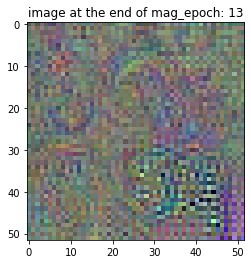

begin mag_epoch 14, activation: 1.377490520477295
end mag_epoch: 14, activation: 3.725003957748413


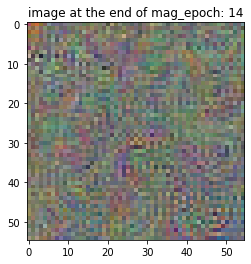

begin mag_epoch 15, activation: 1.8095725774765015
end mag_epoch: 15, activation: 3.7930710315704346


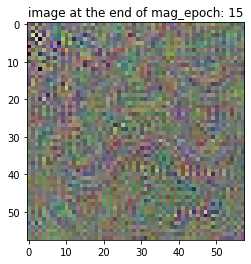

begin mag_epoch 16, activation: 2.1797373294830322
end mag_epoch: 16, activation: 4.211158752441406


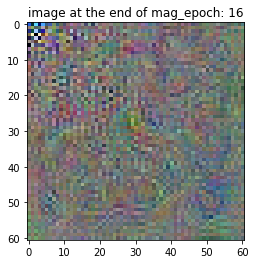

begin mag_epoch 17, activation: 1.8914586305618286
end mag_epoch: 17, activation: 3.8711133003234863


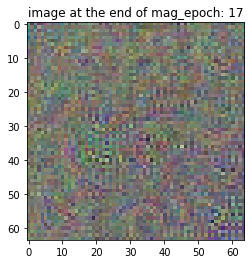

begin mag_epoch 18, activation: 2.263397455215454
end mag_epoch: 18, activation: 3.8560919761657715


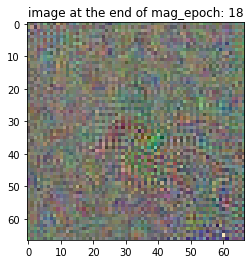

begin mag_epoch 19, activation: 2.0186469554901123
end mag_epoch: 19, activation: 4.283758163452148


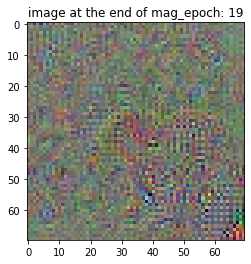

begin mag_epoch 20, activation: 1.9048436880111694
end mag_epoch: 20, activation: 4.159848213195801


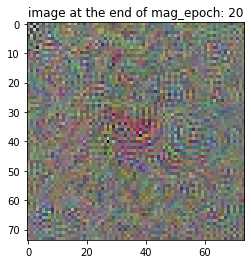

begin mag_epoch 21, activation: 2.2837607860565186
end mag_epoch: 21, activation: 4.594033241271973


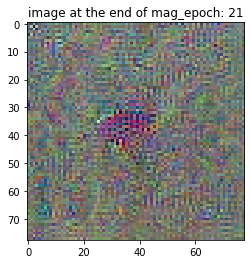

begin mag_epoch 22, activation: 2.1058385372161865
end mag_epoch: 22, activation: 4.200338363647461


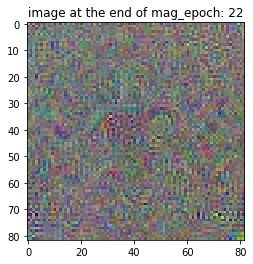

begin mag_epoch 23, activation: 2.569108247756958
end mag_epoch: 23, activation: 4.272665977478027


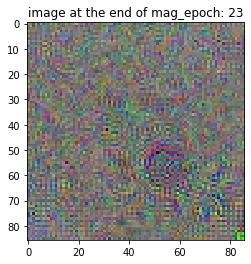

begin mag_epoch 24, activation: 2.1833102703094482
end mag_epoch: 24, activation: 4.250847816467285


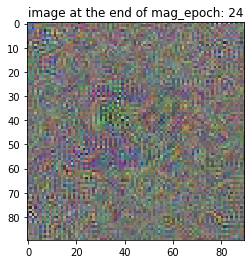

begin mag_epoch 25, activation: 2.3830111026763916
end mag_epoch: 25, activation: 4.225179672241211


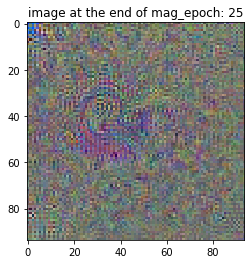

begin mag_epoch 26, activation: 2.284303903579712
end mag_epoch: 26, activation: 4.371325969696045


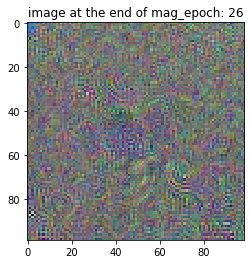

begin mag_epoch 27, activation: 2.227544069290161
end mag_epoch: 27, activation: 4.030187129974365


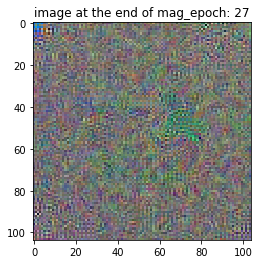

begin mag_epoch 28, activation: 2.2701549530029297
end mag_epoch: 28, activation: 4.441161155700684


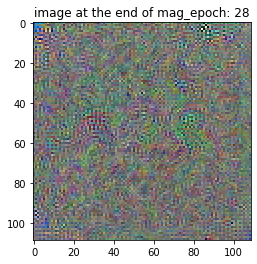

begin mag_epoch 29, activation: 2.3592944145202637
end mag_epoch: 29, activation: 4.219815731048584


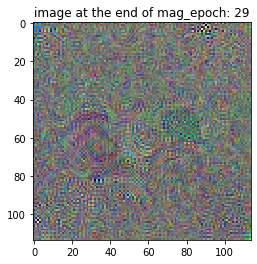

begin mag_epoch 30, activation: 2.1402747631073
end mag_epoch: 30, activation: 4.011070728302002


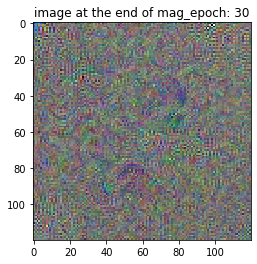

begin mag_epoch 31, activation: 2.1730103492736816
end mag_epoch: 31, activation: 4.254887580871582


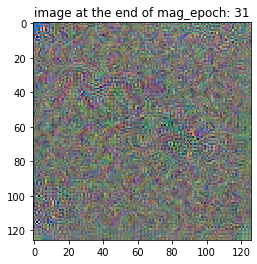

begin mag_epoch 32, activation: 2.4112024307250977
end mag_epoch: 32, activation: 4.180027961730957


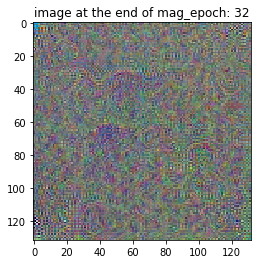

begin mag_epoch 33, activation: 2.2880494594573975
end mag_epoch: 33, activation: 4.22758674621582


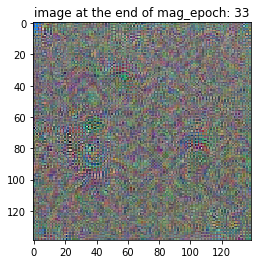

begin mag_epoch 34, activation: 2.141602039337158
end mag_epoch: 34, activation: 4.026707649230957


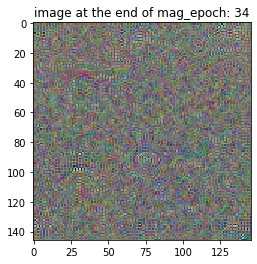

begin mag_epoch 35, activation: 2.168748140335083
end mag_epoch: 35, activation: 4.265259742736816


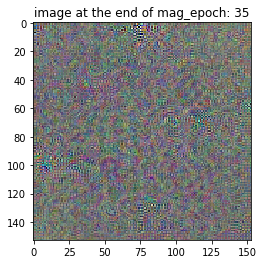

begin mag_epoch 36, activation: 2.291346788406372
end mag_epoch: 36, activation: 4.183243751525879


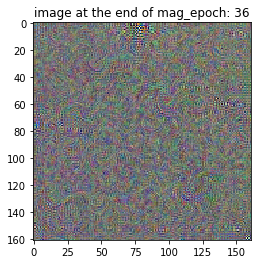

begin mag_epoch 37, activation: 2.3167619705200195


In [ ]:
unit_idx = 500 # the neuron to visualize
act_wt = 1 # factor by which to weigh the activation relative to the regulizer terms

model.eval()
for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr = 0.4)
    
    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()
        model(img_tensor.unsqueeze(0))
        layer_out = activation['4a']
        rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
        # terminate if rms is nan
        if torch.isnan(rms):
            print('Error: rms was Nan; Terminating ...')
            sys.exit()
        
        # pixel intensity
        pxl_inty = torch.pow((img_tensor**2).mean(), 0.5)
        # terminate if pxl_inty is nan
        if torch.isnan(pxl_inty):
            print('Error: Pixel Intensity was Nan; Terminating ...')
            sys.exit()
            
        # image gradients
        im_grd = grad_loss(img_tensor, beta = 1)
        # terminate is im_grd is nan
        if torch.isnan(im_grd):
            print('Error: image gradients were Nan; Terminating ...')
            sys.exit()
        
        loss = -act_wt*rms + pxl_inty + im_grd        
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, rms))
        loss.backward()
        optimizer.step()
        
    # view the result of optimising the image
    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, rms))
    img = image_converter(img_tensor)    
    plt.imshow(img)
    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    plt.show()
    
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

In [45]:
im_grd

tensor(2.1376, device='cuda:0', grad_fn=<MulBackward0>)

In [173]:
img_tensor.shape

torch.Size([3, 261, 261])

In [175]:
denormalize(img_tensor)

tensor([[[0.5396, 0.7772, 0.9756,  ..., 0.3751, 0.4282, 0.4378],
         [0.9671, 0.9003, 0.9065,  ..., 0.4870, 0.5115, 0.4983],
         [1.0000, 0.4232, 0.9157,  ..., 0.4540, 0.4633, 0.4554],
         ...,
         [0.5628, 0.5025, 0.5549,  ..., 0.5069, 0.4962, 0.4919],
         [0.5458, 0.5459, 0.4951,  ..., 0.4974, 0.4834, 0.4605],
         [0.5611, 0.5007, 0.4618,  ..., 0.4958, 0.4952, 0.4704]],

        [[0.3859, 0.3922, 0.4674,  ..., 0.3811, 0.4180, 0.4046],
         [0.5087, 0.4097, 0.3583,  ..., 0.4888, 0.4924, 0.4526],
         [0.7574, 0.0986, 0.4117,  ..., 0.4577, 0.4439, 0.4076],
         ...,
         [0.4082, 0.4361, 0.4675,  ..., 0.4588, 0.4692, 0.4717],
         [0.4463, 0.4784, 0.4699,  ..., 0.4527, 0.4585, 0.4620],
         [0.4760, 0.4656, 0.4530,  ..., 0.4581, 0.4507, 0.4543]],

        [[0.1700, 0.0121, 0.1740,  ..., 0.3056, 0.3091, 0.3064],
         [0.1788, 0.0128, 0.1389,  ..., 0.4023, 0.4122, 0.4031],
         [0.4720, 0.0337, 0.4444,  ..., 0.3778, 0.3756, 0.